In [46]:
# import basic packages and check XenonPy version (should be >0.5)

import os
import scipy.io as sio
import pandas as pd
import numpy as np
import pickle as pk
from copy import deepcopy
from scipy.stats import invwishart, multivariate_normal, norm
from scipy.special import logsumexp
from scipy import interpolate

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import r2_score
from sklearn.cluster import KMeans

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

import xenonpy
xenonpy.__version__

%run HBM_Gibbs_noMissing.py


'0.6.1'

### Synthesize data

Training data

In [2]:
rand_seed = 202111

N_site = 20
N_site_num = 10

mu0_true = np.array([
    [0, 0], # cluster 1
    [0, 0], # cluster 2
    [0, 0] # cluster 3
])

C0_sig_true =  np.array([
    [1, 1], # cluster 1
    [1, 1], # cluster 2
    [1, 1] # cluster 3
])

C0_rho_true =  np.array([
    0, # cluster 1
    0,  # cluster 2
    0  # cluster 3
])

nu0_true = np.array([8, 8, 8])

Sig0_sig_true =  np.array([
    [1, 1], # cluster 1
    [1, 1], # cluster 2
    [1, 1] # cluster 3
])

Sig0_rho_true =  np.array([
    0.9, # cluster 1
    0,  # cluster 2
    -0.9,  # cluster 3
])


In [3]:
N_dim_true = len(mu0_true[0])
N_c = len(mu0_true)

# assemble C0 and Sig0

C0_true = []
for sig, rho in zip(C0_sig_true, C0_rho_true):
    C0_true.append(np.array([
        [sig[0]**2, sig[0]*sig[1]*rho],
        [sig[0]*sig[1]*rho, sig[1]**2]]))
    
Sig0_true = []
for sig, rho in zip(Sig0_sig_true, Sig0_rho_true):
    Sig0_true.append(5*np.array([
        [sig[0]**2, sig[0]*sig[1]*rho],
        [sig[0]*sig[1]*rho, sig[1]**2]]))

# generate mu, C and data for each site of each cluster
np.random.seed(rand_seed)

mu_true, C_true, x_true = [], [], []
for mu, c0, nu, sig0 in zip(mu0_true, C0_true, nu0_true, Sig0_true):
    mu_true.append(multivariate_normal.rvs(mean=mu, cov=c0, size=N_site))
    C_true.append(invwishart.rvs(df=nu, scale=sig0, size=N_site))
    x_true.append([multivariate_normal.rvs(mean=mu_true[-1][j,:], cov=C_true[-1][j,:,:], size=N_site_num) for j in range(N_site)])
    

Test data

In [4]:
rand_seed_test = 20211100

N_site_test = 5
N_site_num_test = 10


In [5]:
# generate mu, C and data for each site of each cluster
np.random.seed(rand_seed_test)

mu_test, C_test, x_test = [], [], []
for i, mu in enumerate(mu0_true):
    mu_test.append(multivariate_normal.rvs(mean=mu, cov=C0_true[i], size=N_site_test))
    C_test.append(invwishart.rvs(df=nu0_true[i], scale=Sig0_true[i], size=N_site_test))
    x_test.append([multivariate_normal.rvs(mean=mu_test[-1][j,:], cov=C_test[-1][j,:,:], size=N_site_num_test) for j in range(N_site_test)])
    

In [21]:
x_test_df = []
for j, val_j in enumerate(x_test):
    for i, val in enumerate(val_j):
        tmp_df = pd.DataFrame(val, index=[f'{j+1}-{i}_{x}' for x in range(val.shape[0])])
        tmp_df['label'] = f'{j+1}-{i}'
        x_test_df.append(deepcopy(tmp_df))

x_test_df = pd.concat(x_test_df, axis=0)

x_test_df


,0,1,label
1-0_0,-1.285850,-0.144506,1-0
1-0_1,-0.839761,-0.320558,1-0
1-0_2,-0.236015,0.485037,1-0
1-0_3,-0.406046,0.503852,1-0
1-0_4,-1.145778,-0.348210,1-0
...,...,...,...
3-4_5,-1.756416,1.351008,3-4
3-4_6,-2.497661,1.993592,3-4
3-4_7,-1.868547,1.231451,3-4
3-4_8,-2.124047,1.935788,3-4


In [6]:
dir_save_data = f'Data/SynData_Cluster_D{N_dim_true}_Str{rand_seed}_Ste{rand_seed_test}'
os.makedirs(dir_save_data, exist_ok=True)

with open(f'{dir_save_data}/raw_data.pkl', 'wb') as f:
    pk.dump({'mu_train': mu_true, 'C_train': C_true, 'x_train': x_true, 'mu_test': mu_test, 'C_test': C_test, 'x_test': x_test}, f)
    

Plot data

In [13]:
%%time

tmp_list = np.array(list(range(N_dim_true)))
col_mu = [f'mu_{x}' for x in tmp_list]
col_sig = [f'sig_{x}' for x in tmp_list]
col_rho = [f'rho_{y}-{x}' for i, y in enumerate(tmp_list[1:]) for x in tmp_list[:(i+1)]]

data_Gauss_true = [pd.DataFrame() for _ in range(N_c)]
for j in range(N_c):
    for i in range(N_site):
        mu = pd.Series(mu_true[j][i,:])
        cov = C_true[j][i,:,:]
        sig = pd.Series(np.sqrt(np.diag(cov)))
        rho = pd.Series([cov[y,x]/sig[y]/sig[x] for i, y in enumerate(tmp_list[1:]) for x in tmp_list[:(i+1)]])
        data_Gauss_true[j] = data_Gauss_true[j].append(deepcopy(pd.Series(np.concatenate([mu, sig, rho]), name=f'{j+1}-{i}')))
    
    data_Gauss_true[j].columns = col_mu+col_sig+col_rho

data_Gauss_true

# test data
tmp_list = np.array(list(range(N_dim_true)))
col_mu = [f'mu_{x}' for x in tmp_list]
col_sig = [f'sig_{x}' for x in tmp_list]
col_rho = [f'rho_{y}-{x}' for i, y in enumerate(tmp_list[1:]) for x in tmp_list[:(i+1)]]

data_Gauss_test = [pd.DataFrame() for _ in range(N_c)]
for j in range(N_c):
    for i in range(N_site_test):
        mu = pd.Series(mu_test[j][i,:])
        cov = C_test[j][i,:,:]
        sig = pd.Series(np.sqrt(np.diag(cov)))
        rho = pd.Series([cov[y,x]/sig[y]/sig[x] for i, y in enumerate(tmp_list[1:]) for x in tmp_list[:(i+1)]])
        data_Gauss_test[j] = data_Gauss_test[j].append(deepcopy(pd.Series(np.concatenate([mu, sig, rho]), name=f'{j+1}-{i}')))
    
    data_Gauss_test[j].columns = col_mu+col_sig+col_rho


CPU times: user 149 ms, sys: 4.78 ms, total: 153 ms
Wall time: 149 ms


In [14]:
%%time

data_Gauss_true_est = [pd.DataFrame() for _ in range(N_c)]
for j in range(N_c):
    for i in range(N_site):
        target_data = pd.DataFrame(x_true[j][i])
        mu = target_data.mean(axis=0)
        cov = pd.DataFrame(index=target_data.columns, columns=target_data.columns)
        tmp = target_data.cov(min_periods=3)
        cov.loc[:,:] = tmp
        sig = pd.Series(np.sqrt(np.diag(cov)), index=target_data.columns)
        rho = pd.Series([cov.loc[y,x]/sig[y]/sig[x] for i, y in enumerate(target_data.columns.values[1:]) for x in target_data.columns.values[:(i+1)]])
        data_Gauss_true_est[j] = data_Gauss_true_est[j].append(deepcopy(pd.Series(np.concatenate([mu, sig, rho]), name=f'{j+1}-{i}')))

    data_Gauss_true_est[j].columns = col_mu+col_sig+col_rho

data_Gauss_true_est

# test data
data_Gauss_test_est = [pd.DataFrame() for _ in range(N_c)]
for j in range(N_c):
    for i in range(N_site_test):
        target_data = pd.DataFrame(x_test[j][i])
        mu = target_data.mean(axis=0)
        cov = pd.DataFrame(index=target_data.columns, columns=target_data.columns)
        tmp = target_data.cov(min_periods=3)
        cov.loc[:,:] = tmp
        sig = pd.Series(np.sqrt(np.diag(cov)), index=target_data.columns)
        rho = pd.Series([cov.loc[y,x]/sig[y]/sig[x] for i, y in enumerate(target_data.columns.values[1:]) for x in target_data.columns.values[:(i+1)]])
        data_Gauss_test_est[j] = data_Gauss_test_est[j].append(deepcopy(pd.Series(np.concatenate([mu, sig, rho]), name=f'{j+1}-{i}')))

    data_Gauss_test_est[j].columns = col_mu+col_sig+col_rho


CPU times: user 251 ms, sys: 2.81 ms, total: 254 ms
Wall time: 252 ms


CPU times: user 13 s, sys: 174 ms, total: 13.2 s
Wall time: 6.97 s


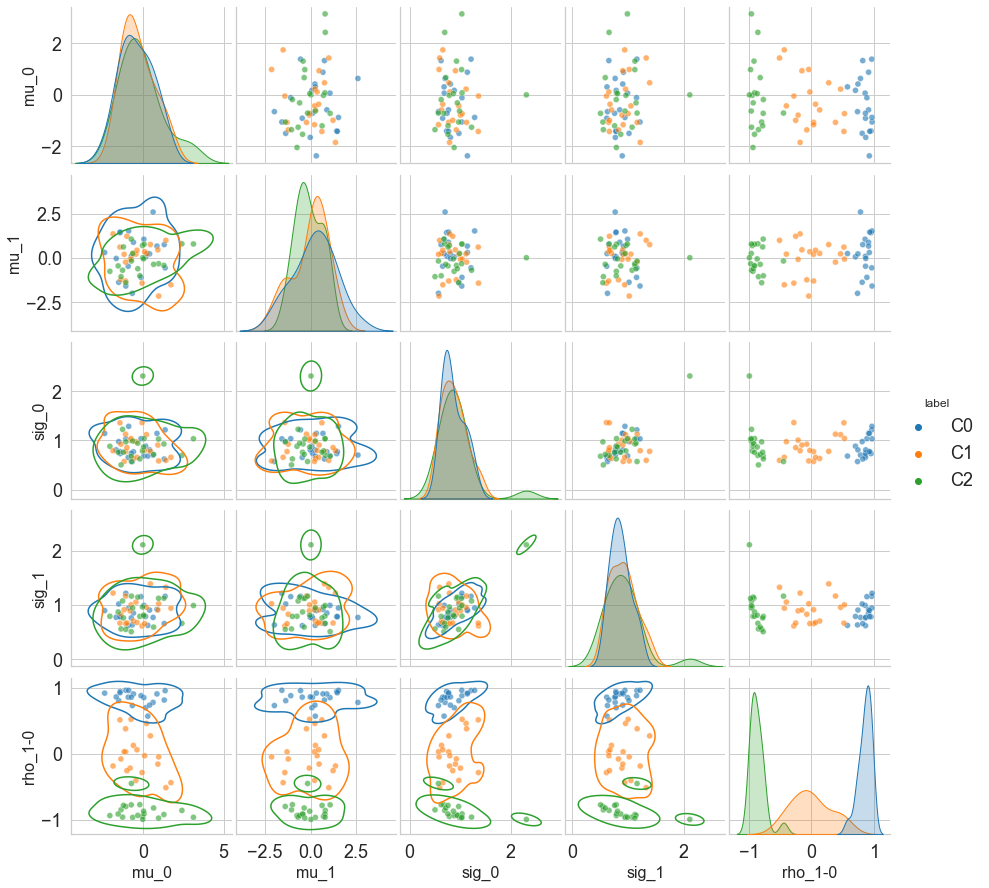

In [12]:
%%time

v_alpha = 0.6

dir_plot = f'PairPlots/Synthetic_test_Cluster_D{N_dim_true}'
os.makedirs(dir_plot, exist_ok=True)

val_s = data_Gauss_true
tmp_plot_df = []
for key, tmp_df in enumerate(val_s):
    tmp_df['label'] = f'C{key}'
    tmp_plot_df.append(deepcopy(tmp_df))
tmp_plot_df = pd.concat(tmp_plot_df, axis=0)
tmp_color = sns.color_palette("tab10")[:len(val_s)]

sns.set(rc={'font.size': 8, 'axes.labelsize': 16, 'legend.fontsize': 18, 
    'axes.titlesize': 8, 'xtick.labelsize': 18, 'ytick.labelsize': 18})
sns.set_style("whitegrid") 
# sns.set_style("ticks", {"xtick.major.size":8, "ytick.major.size":8})

sns_plot = sns.pairplot(tmp_plot_df, diag_kind="kde", hue='label', 
                     palette=tmp_color, plot_kws={'alpha': v_alpha})
sns_plot.map_lower(sns.kdeplot, levels=2, color=".2")
sns_plot.savefig(f'{dir_plot}/original_train.png', dpi=500)


CPU times: user 13.2 s, sys: 77.8 ms, total: 13.2 s
Wall time: 6.88 s


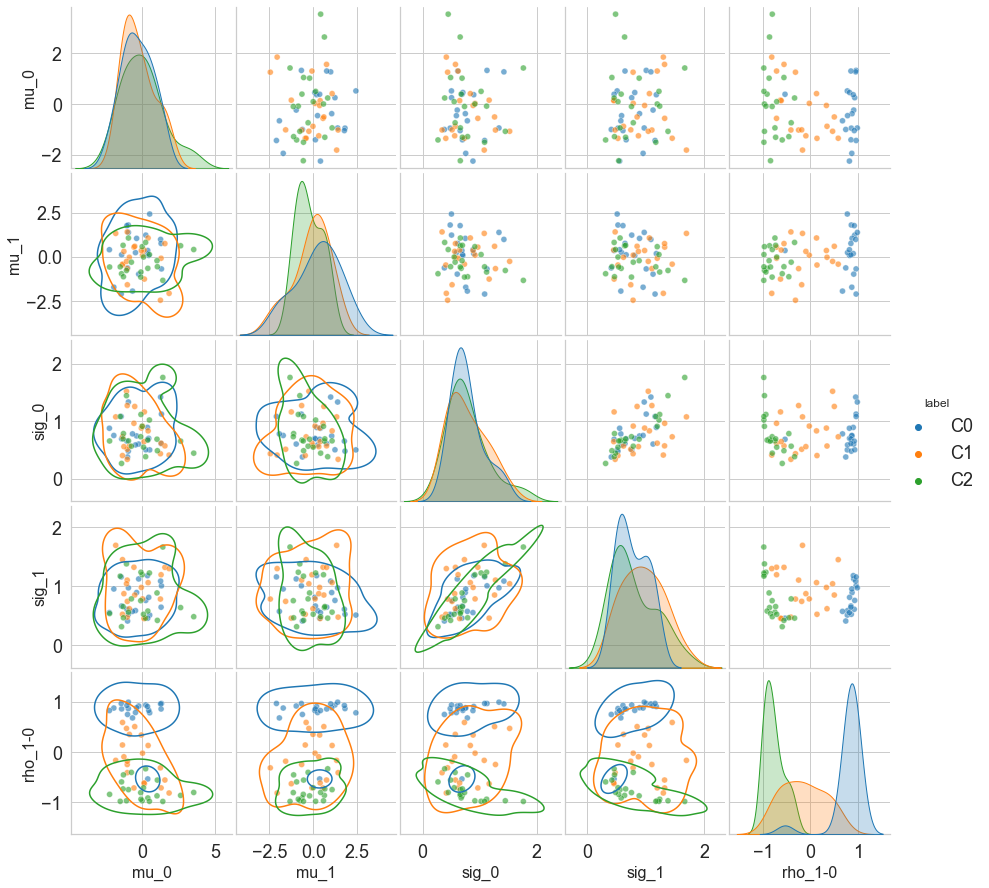

In [15]:
%%time

v_alpha = 0.6

dir_plot = f'PairPlots/Synthetic_test_Cluster_D{N_dim_true}'
os.makedirs(dir_plot, exist_ok=True)

val_s = data_Gauss_true_est
tmp_plot_df = []
for key, tmp_df in enumerate(val_s):
    tmp_df['label'] = f'C{key}'
    tmp_plot_df.append(deepcopy(tmp_df))
tmp_plot_df = pd.concat(tmp_plot_df, axis=0)
tmp_color = sns.color_palette("tab10")[:len(val_s)]

sns.set(rc={'font.size': 8, 'axes.labelsize': 16, 'legend.fontsize': 18, 
    'axes.titlesize': 8, 'xtick.labelsize': 18, 'ytick.labelsize': 18})
sns.set_style("whitegrid") 
# sns.set_style("ticks", {"xtick.major.size":8, "ytick.major.size":8})

sns_plot = sns.pairplot(tmp_plot_df, diag_kind="kde", hue='label', 
                     palette=tmp_color, plot_kws={'alpha': v_alpha})
sns_plot.map_lower(sns.kdeplot, levels=2, color=".2")
sns_plot.savefig(f'{dir_plot}/original_train_est.png', dpi=500)


CPU times: user 12.5 s, sys: 132 ms, total: 12.7 s
Wall time: 7.17 s


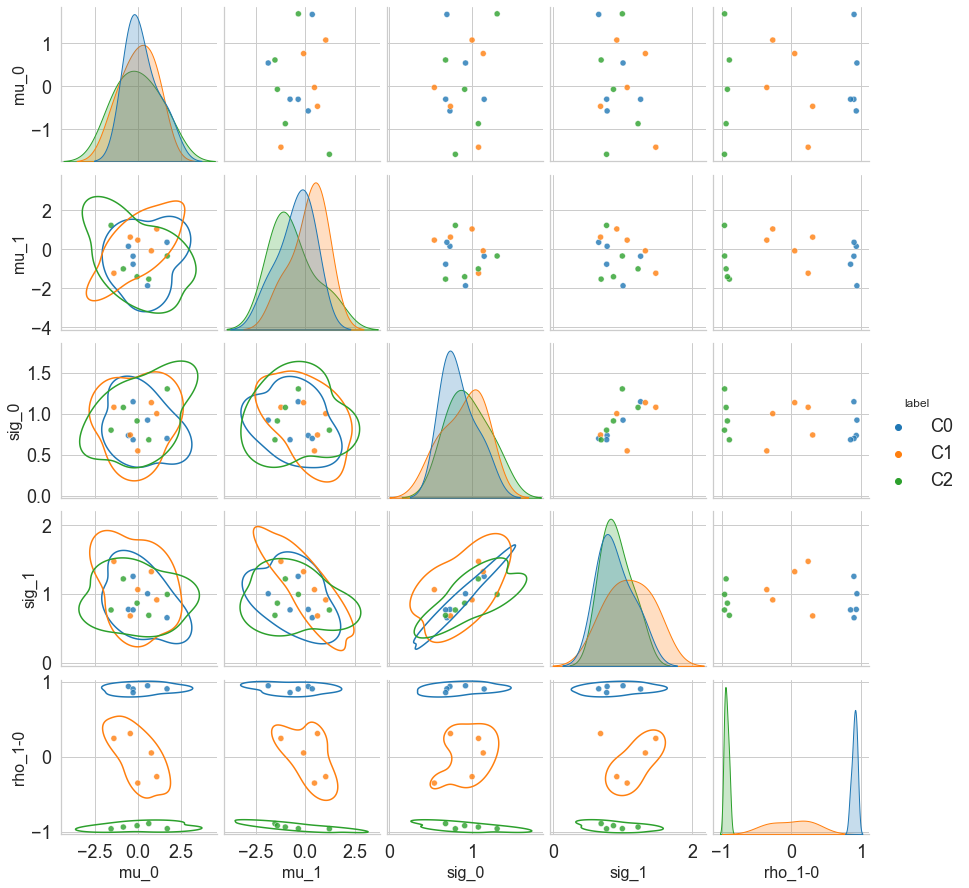

In [16]:
%%time

v_alpha = 0.8

dir_plot = f'PairPlots/Synthetic_test_Cluster_D{N_dim_true}'
os.makedirs(dir_plot, exist_ok=True)

val_s = data_Gauss_test
tmp_plot_df = []
for key, tmp_df in enumerate(val_s):
    tmp_df['label'] = f'C{key}'
    tmp_plot_df.append(deepcopy(tmp_df))
tmp_plot_df = pd.concat(tmp_plot_df, axis=0)
tmp_color = sns.color_palette("tab10")[:len(val_s)]

sns.set(rc={'font.size': 8, 'axes.labelsize': 16, 'legend.fontsize': 18, 
    'axes.titlesize': 8, 'xtick.labelsize': 18, 'ytick.labelsize': 18})
sns.set_style("whitegrid") 
# sns.set_style("ticks", {"xtick.major.size":8, "ytick.major.size":8})

sns_plot = sns.pairplot(tmp_plot_df, diag_kind="kde", hue='label', 
                     palette=tmp_color, plot_kws={'alpha': v_alpha})
sns_plot.map_lower(sns.kdeplot, levels=2, color=".2")
sns_plot.savefig(f'{dir_plot}/original_test.png', dpi=500)


CPU times: user 12.4 s, sys: 92.1 ms, total: 12.5 s
Wall time: 7.13 s


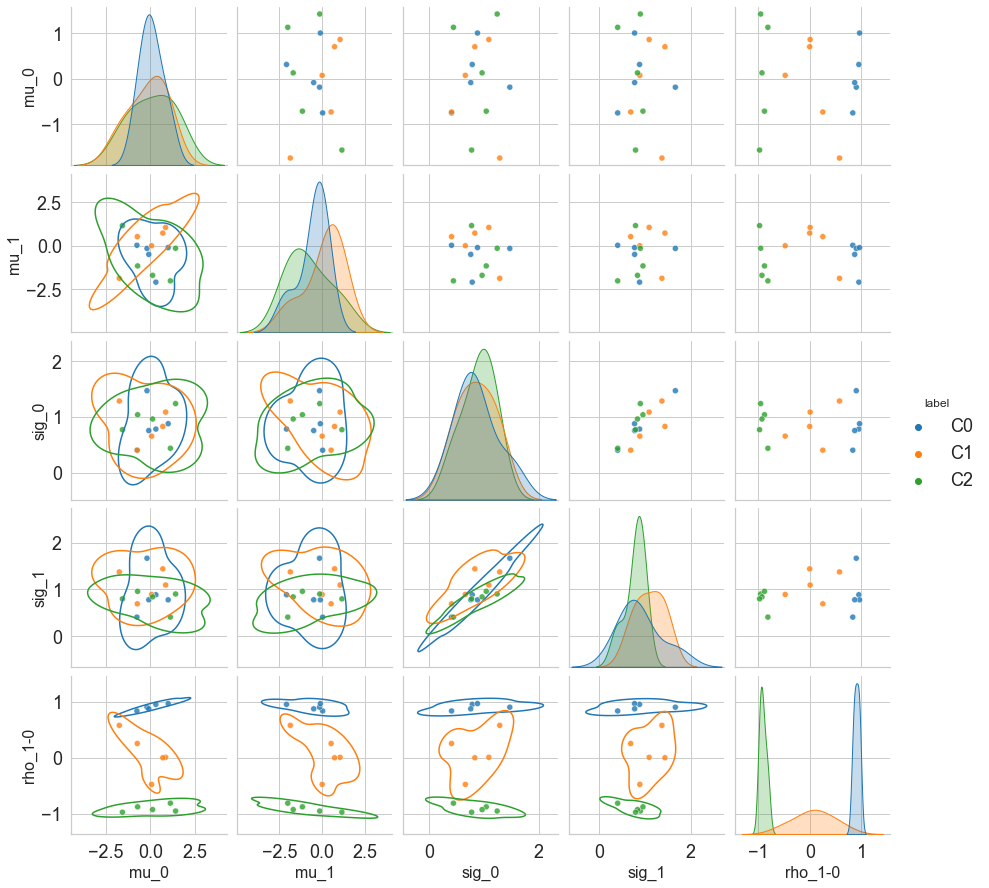

In [17]:
%%time

v_alpha = 0.8

dir_plot = f'PairPlots/Synthetic_test_Cluster_D{N_dim_true}'
os.makedirs(dir_plot, exist_ok=True)

val_s = data_Gauss_test_est
tmp_plot_df = []
for key, tmp_df in enumerate(val_s):
    tmp_df['label'] = f'C{key}'
    tmp_plot_df.append(deepcopy(tmp_df))
tmp_plot_df = pd.concat(tmp_plot_df, axis=0)
tmp_color = sns.color_palette("tab10")[:len(val_s)]

sns.set(rc={'font.size': 8, 'axes.labelsize': 16, 'legend.fontsize': 18, 
    'axes.titlesize': 8, 'xtick.labelsize': 18, 'ytick.labelsize': 18})
sns.set_style("whitegrid") 
# sns.set_style("ticks", {"xtick.major.size":8, "ytick.major.size":8})

sns_plot = sns.pairplot(tmp_plot_df, diag_kind="kde", hue='label', 
                     palette=tmp_color, plot_kws={'alpha': v_alpha})
sns_plot.map_lower(sns.kdeplot, levels=2, color=".2")
sns_plot.savefig(f'{dir_plot}/original_test_est.png', dpi=500)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


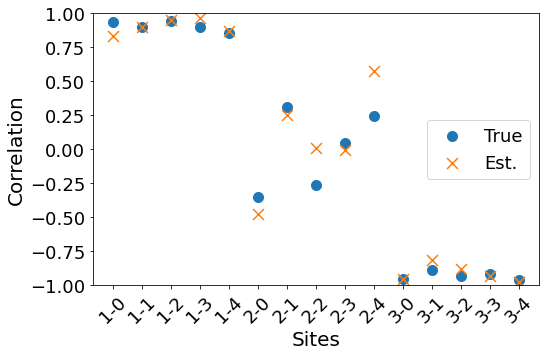

In [20]:
dir_plot = f'HBM_plots/Synthetic_test_Cluster_D{N_dim_true}'
os.makedirs(dir_plot, exist_ok=True)

tmp_plot = pd.concat([pd.concat(data_Gauss_test)['rho_1-0'].rename('rho_1-0_true'), pd.concat(data_Gauss_test_est)['rho_1-0']], axis=1)

c_list = sns.color_palette("tab10")[:2]

_ = plt.figure(figsize=(8, 5))
_ = plt.scatter(tmp_plot.index.values, tmp_plot['rho_1-0_true'].values, s=100, c=c_list[0], label='True')
_ = plt.scatter(tmp_plot.index.values, tmp_plot['rho_1-0'].values, s=120, c=c_list[1], marker = 'x', label='Est.')
        
_ =plt.legend(loc='center right', fontsize=18)
_ =plt.ylim([-1, 1])
_ =plt.xticks(fontsize=18, rotation=45)
_ =plt.yticks(fontsize=18)
_ =plt.xlabel('Sites', fontsize=20)
_ =plt.ylabel('Correlation', fontsize=20)
_ =plt.savefig(f'{dir_plot}/Site_rhos.png', dpi=500)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

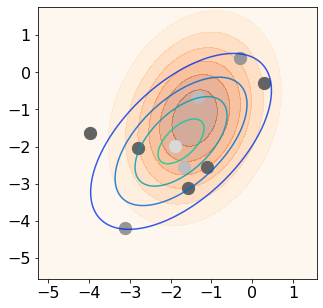

In [92]:
site_plot = '2-4'
N_grid = 100
n = 1000
data_idx =[[0], [2, 4], [6, 8], [1, 3, 5, 7, 9]]
dot_size=150

site_plot_id = [int(x) for x in site_plot.split('-')]
c_list = sns.color_palette("tab20c")[-len(data_idx):][::-1]

target_data = x_test_df.loc[x_test_df.label == site_plot, :].drop('label', axis=1).values
x_max = target_data.max(axis=0)
x_min = target_data.min(axis=0)
x_del = x_max - x_min
xy_max = (x_max + x_del*0.3)
xy_min = (x_min - x_del*0.3)
X = np.linspace(xy_min[0], xy_max[0], N_grid)
Y = np.linspace(xy_min[1], xy_max[1], N_grid)
X, Y = np.meshgrid(X, Y)
pos  = np.dstack((X, Y))

rv = multivariate_normal(mu_test[site_plot_id[0]-1][site_plot_id[1]], C_test[site_plot_id[0]-1][site_plot_id[1]])
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(111)
_ = ax.contourf(X, Y, rv.pdf(pos), cmap='Oranges', alpha=0.4)

mu = target_data.mean(axis=0)
cov = np.cov(target_data.T)
Z = multivariate_normal.pdf(pos, mean=mu, cov=cov)
_ = ax.contour(X, Y, Z, 4, cmap='winter', alpha=0.8)

# get contour level by probability
# Z_bar = Z / Z.sum()
# Z_mu = multivariate_normal.pdf(mu, mean=mu, cov=cov) / Z.sum()
# t = np.linspace(0, Z_bar.max(), n)
# integral = ((Z_bar >= t[:, None, None]) * Z_bar).sum(axis=(1,2))
# f = interpolate.interp1d(integral, t)
# t_contours = f(np.array([0.1]))
# _ = ax.contour(X, Y, Z, t_contours, colors='b')

for iD, idx in enumerate(data_idx):
    _ = ax.scatter(target_data[idx,0], target_data[idx,1], s=dot_size, c=c_list[iD])
    
_ = plt.xticks(fontsize= 16)
_ = plt.yticks(fontsize= 16)
plt.savefig(f'{dir_plot}/Test_site_{site_plot}.png', dpi=500)


### Clustering

Cluster with rho only

In [181]:
case_name = 'RhoOnly'

nS = 10
nC = 3
idx = 3
rand_seed = 202111
tmp_df = deepcopy(data_Gauss_true_est)

cols = [x for x in tmp_df[0].columns.values if 'rho' in x]


##### Clustering

In [182]:
%%time

tmp_df = pd.concat(tmp_df, axis=0)

np.random.seed(rand_seed)
rand_seeds = np.random.randint(0, 2**32-1, size=nS)

kmeans = []
tmp_df_clus = deepcopy(tmp_df)
for r_seed in rand_seeds:
    kmeans.append(KMeans(n_clusters=nC, random_state=r_seed).fit(tmp_df[cols]))

    tmp_lab = pd.DataFrame(kmeans[-1].labels_, index=tmp_df.index, columns=['kmeans'])
    tmp_lab[f'kmeans_{r_seed}'] = 0
    for ii, valK in tmp_lab['kmeans'].value_counts().reset_index()['index'].iteritems():
        tmp_lab[f'kmeans_{r_seed}'].loc[tmp_lab['kmeans'] == valK] = ii
        
    tmp_df_clus = pd.concat([tmp_df_clus, tmp_lab.loc[:,[f'kmeans_{r_seed}']]], axis=1)
    
    tmp_rho = tmp_df_clus.groupby(f'kmeans_{r_seed}').mean().sort_values('rho_1-0', ascending=False).reset_index()
    tmp_map = {val: key for key, val in tmp_rho[f'kmeans_{r_seed}'].iteritems()}
    tmp_df_clus[f'kmeans_sorted_{r_seed}'] = tmp_df_clus[f'kmeans_{r_seed}'].map(tmp_map)

tmp_df_clus.to_csv(f'{dir_save_data}/Kmeans_{case_name}_K{nC}.csv')


/opt/miniconda3/envs/MB16_xepy37_v06_test_env/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/miniconda3/envs/MB16_xepy37_v06_test_env/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/miniconda3/envs/MB16_xepy37_v06_test_env/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documenta

CPU times: user 258 ms, sys: 9 ms, total: 267 ms
Wall time: 262 ms


/opt/miniconda3/envs/MB16_xepy37_v06_test_env/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/miniconda3/envs/MB16_xepy37_v06_test_env/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/miniconda3/envs/MB16_xepy37_v06_test_env/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documenta

##### plot clusters

CPU times: user 2min 29s, sys: 1.17 s, total: 2min 30s
Wall time: 1min 17s


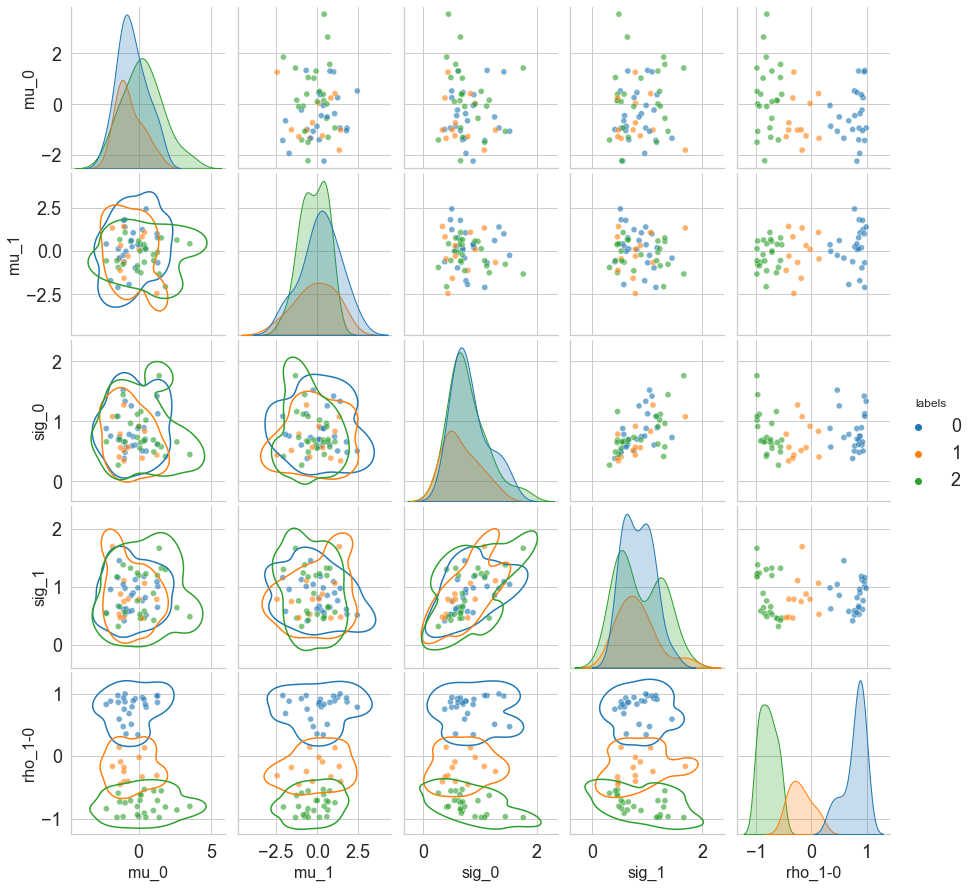

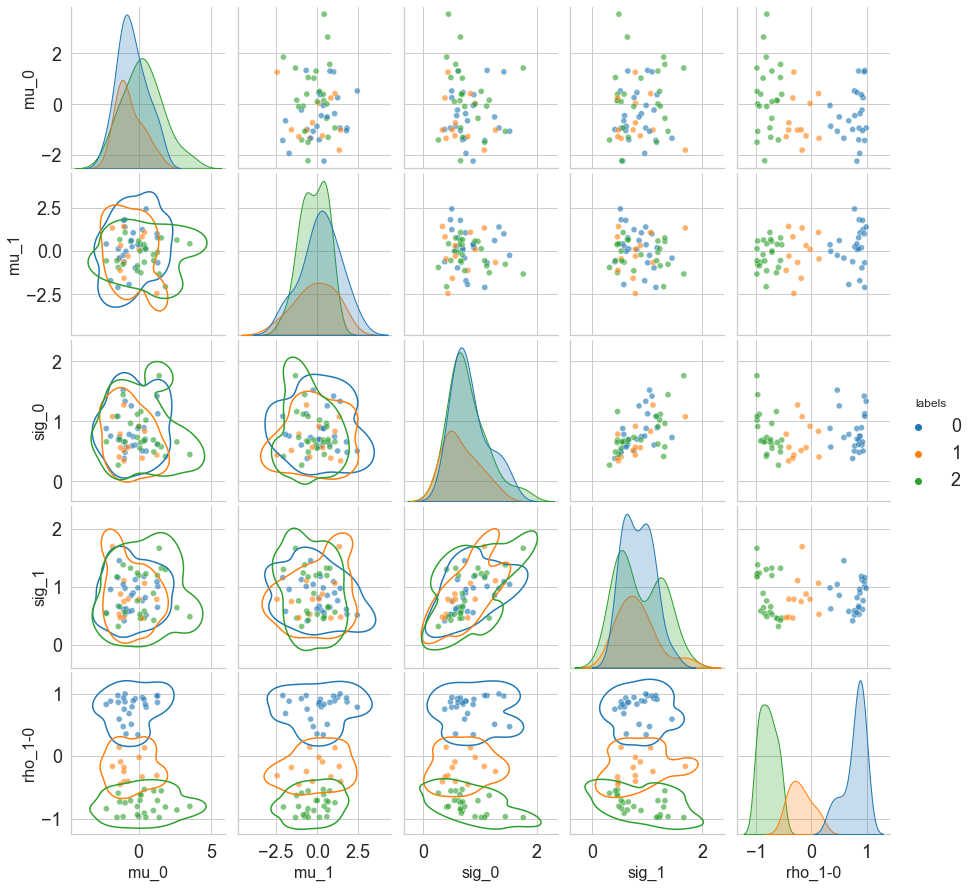

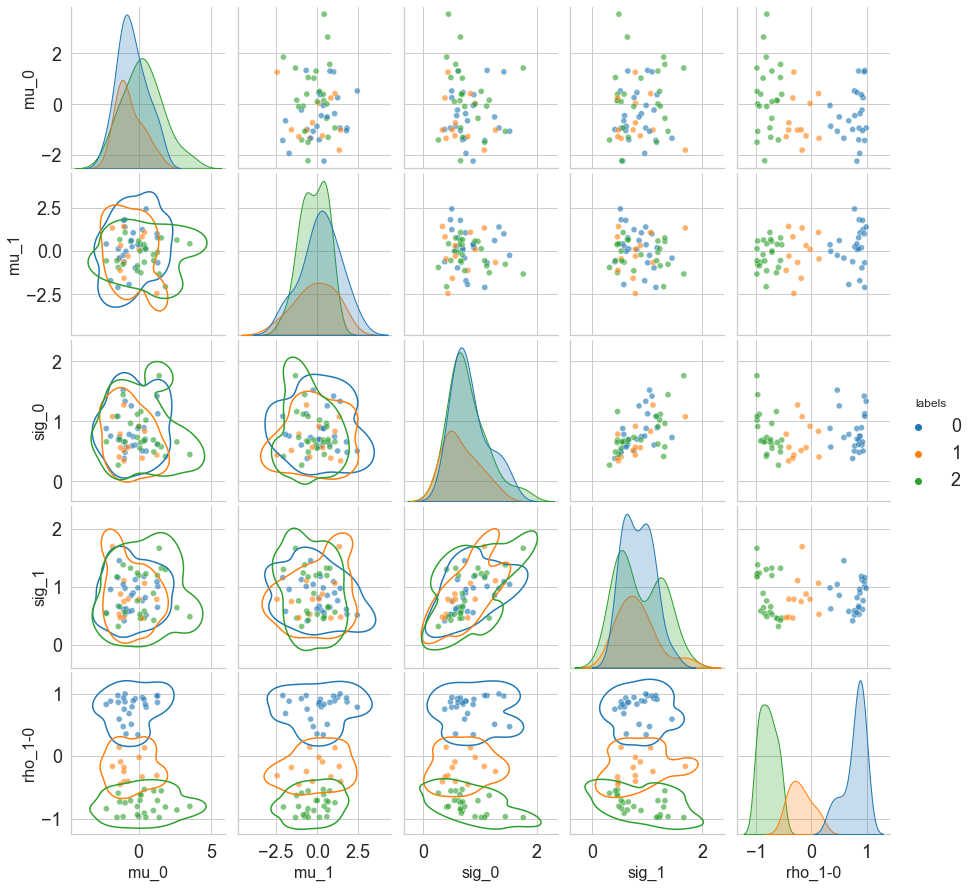

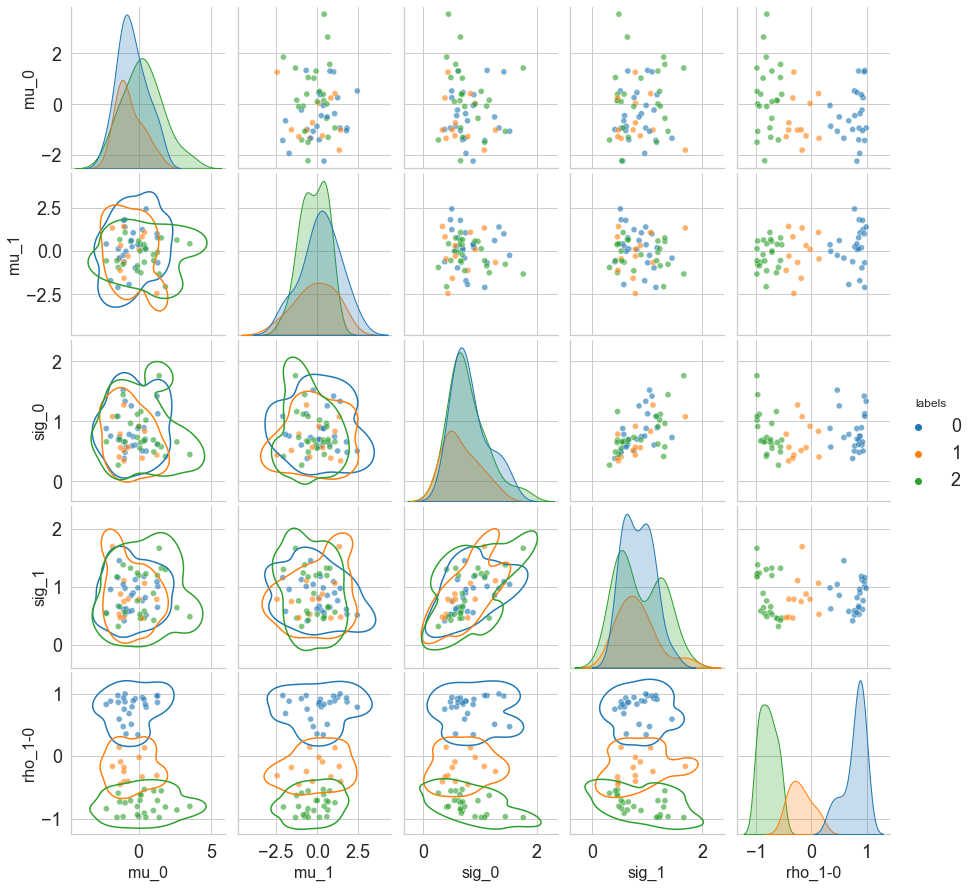

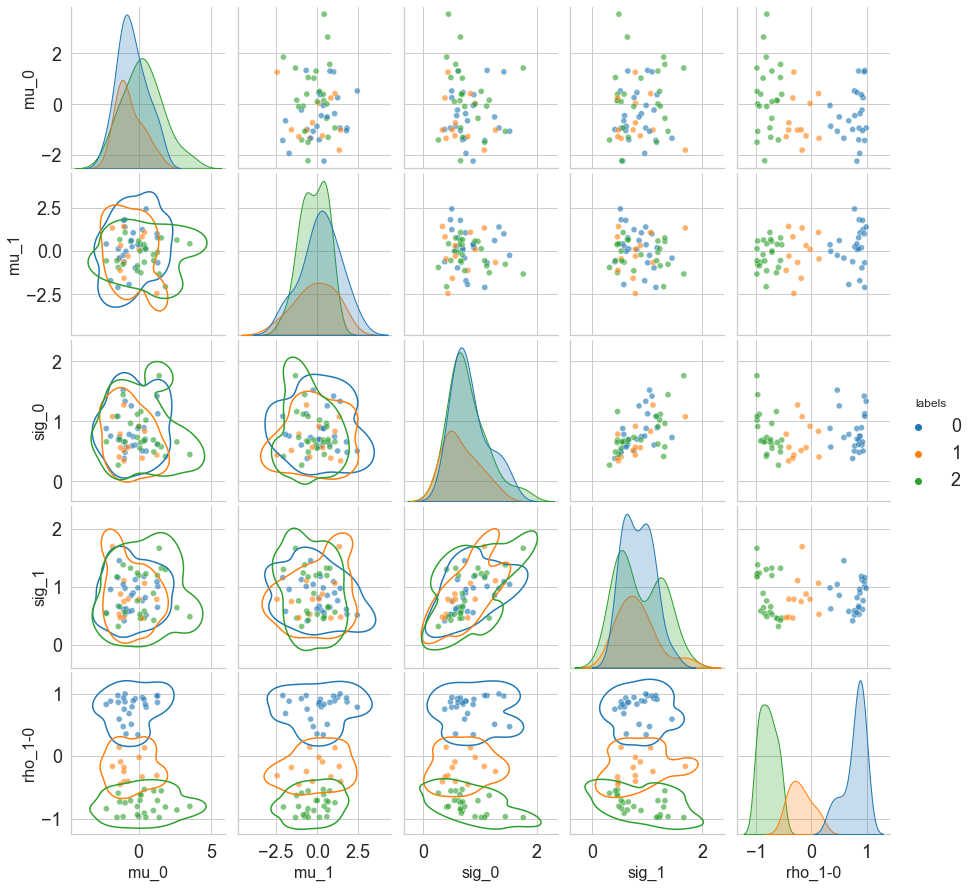

...

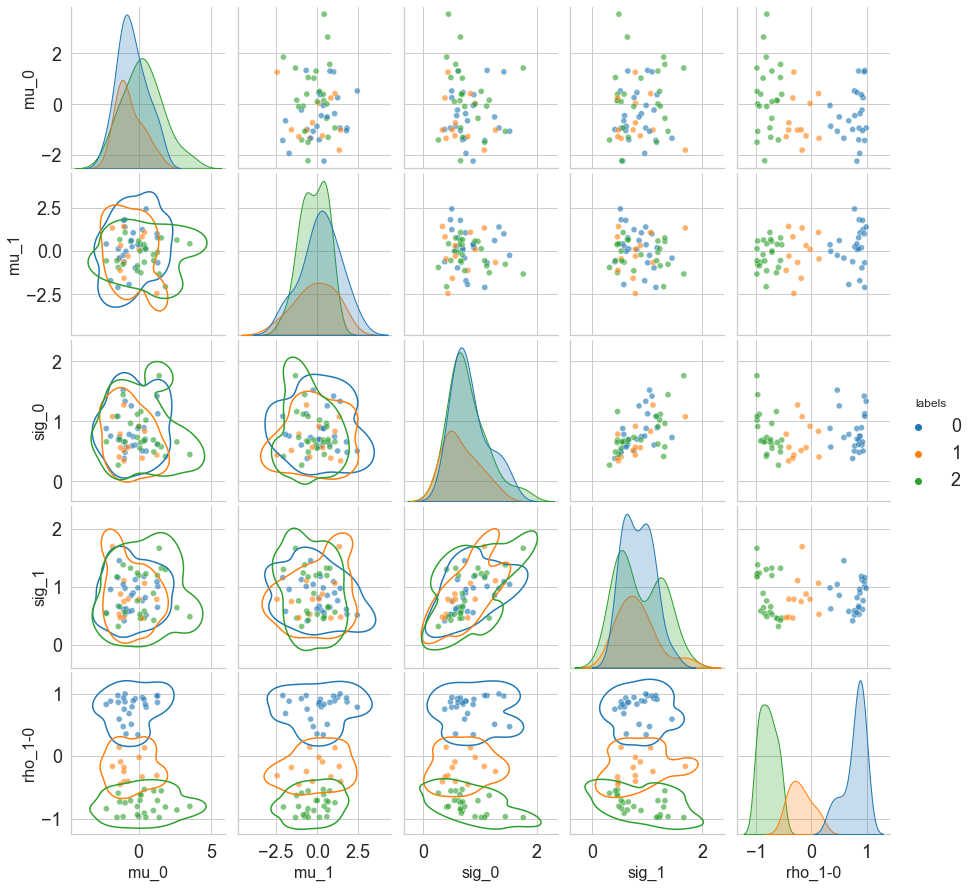

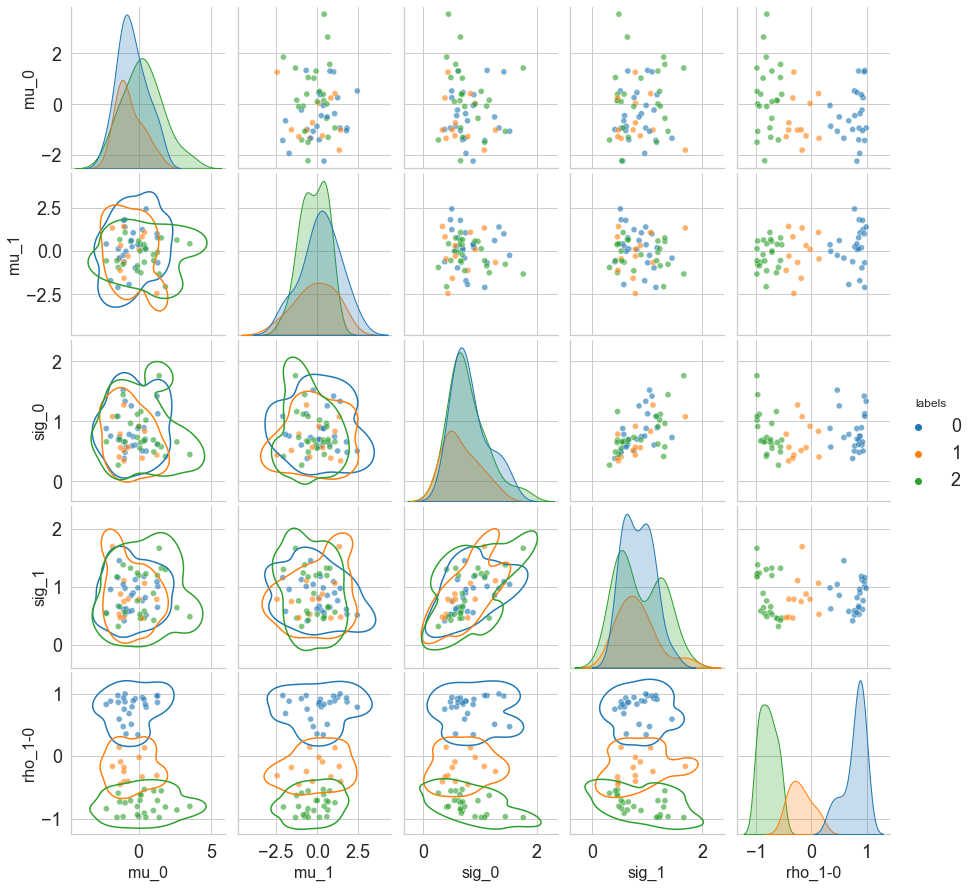

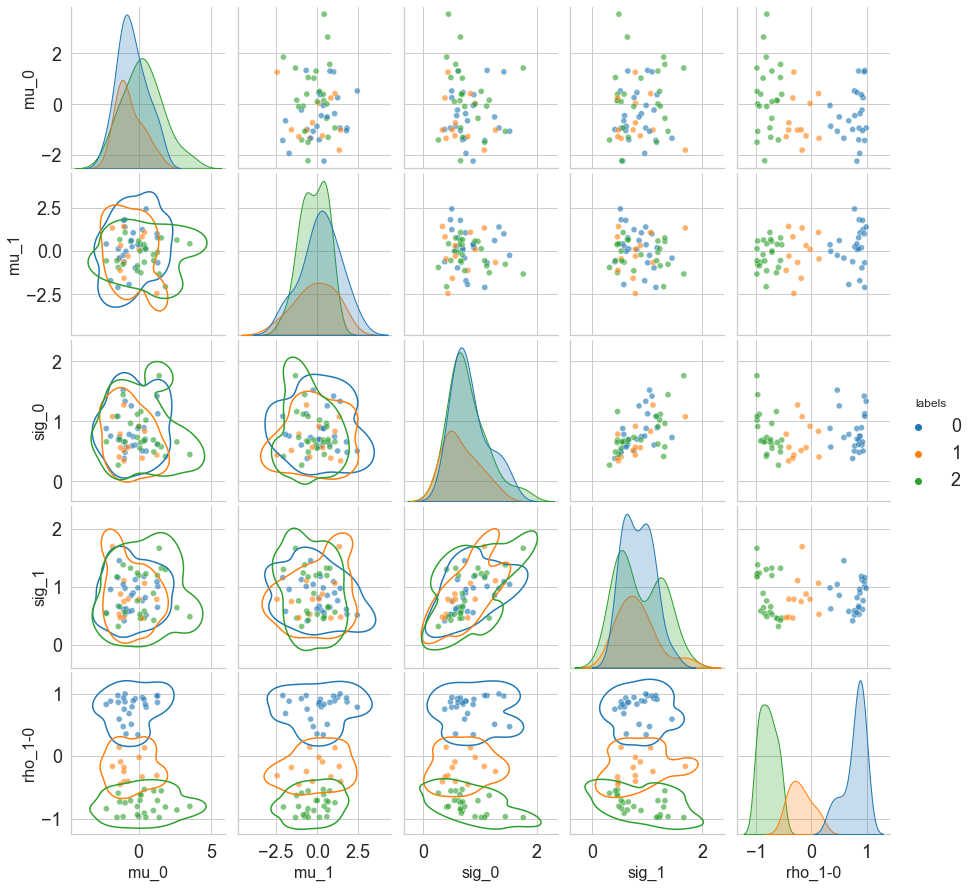

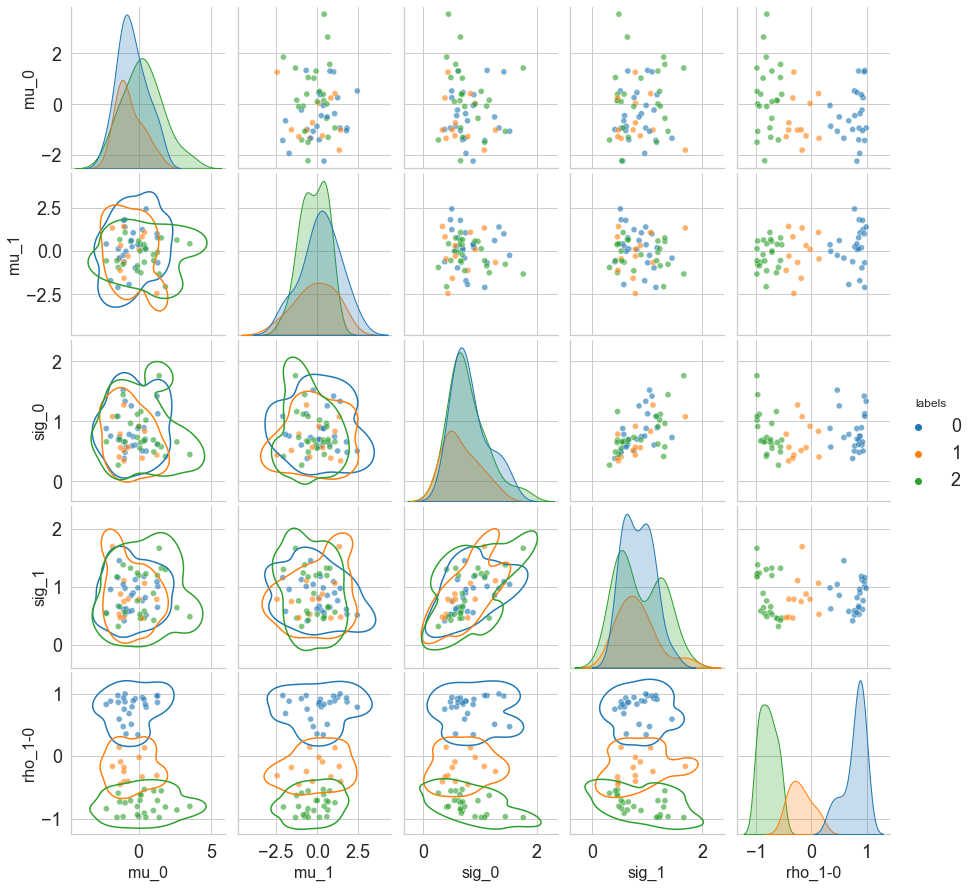

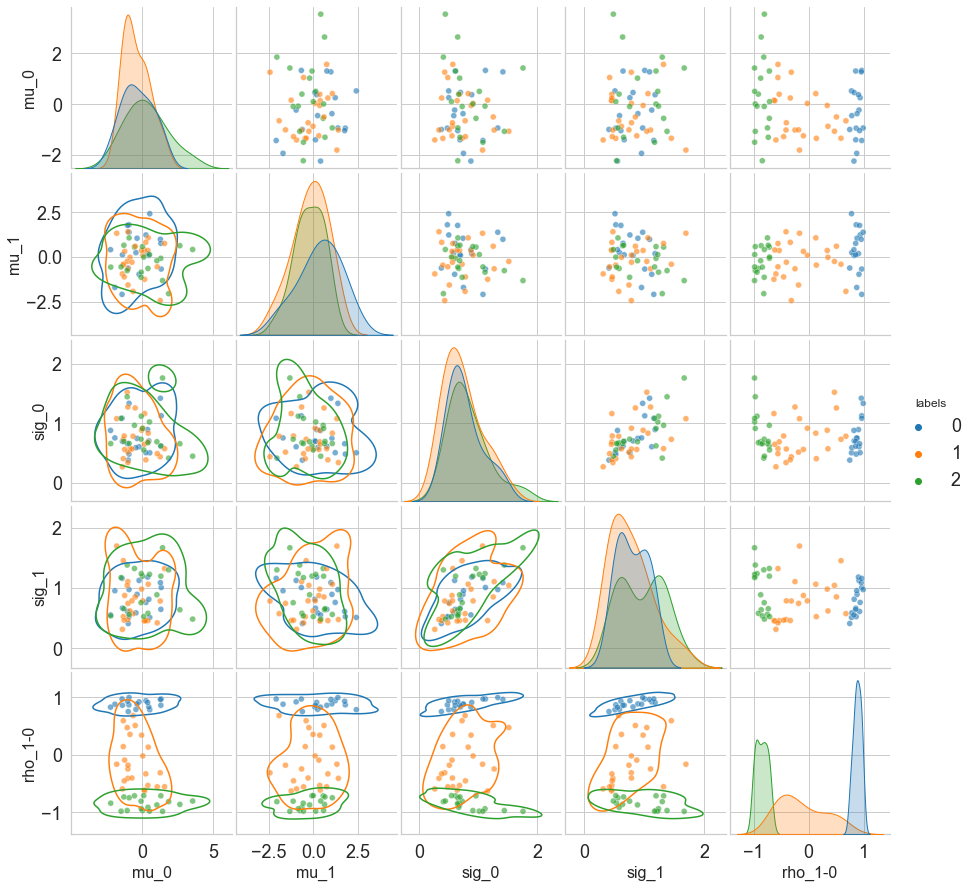

In [80]:
%%time

val_alpha = 0.6
c_list = sns.color_palette("tab10")[:nC]

dir_plot = f'PairPlots/Synthetic_test_Cluster_D{N_dim_true}/Unsupervised_clustering/{case_name}_K{nC}'
os.makedirs(dir_plot, exist_ok=True)

tmp_labs = [x for x in tmp_df_clus.columns.values if 'kmeans_sorted' in x]
tmp_cols = [x for x in tmp_df_clus.columns.values if 'kmeans_' not in x]
for i_lab in tmp_labs:
    ii = i_lab.split('_')[-1]
    
    sns.set(rc={'font.size': 8, 'axes.labelsize': 16, 'legend.fontsize': 18, 
    'axes.titlesize': 8, 'xtick.labelsize': 18, 'ytick.labelsize': 18})
    sns.set_style("whitegrid")

    tmptmp = tmp_df_clus[tmp_cols+[i_lab]]
    tmptmp
    
    sns_plot = sns.pairplot(tmp_df_clus[tmp_cols+[i_lab]].rename({i_lab: 'labels'}, axis=1), diag_kind="kde", hue='labels', 
                     palette=c_list, plot_kws={'alpha': val_alpha})
    sns_plot.map_lower(sns.kdeplot, levels=2, color=".2")
    sns_plot.savefig(f'{dir_plot}/Seed_{ii}.png', dpi=500)
    

### HBM Gibbs

In [183]:
tmp_df_clus = pd.read_csv('Data/SynData_Cluster_D2_Str202111_Ste20211100/Kmeans_RhoOnly_K3.csv', index_col=0)
tmp_df_clus


,mu_0,mu_1,sig_0,sig_1,rho_1-0,kmeans_232152043,kmeans_sorted_232152043,kmeans_2963327645,kmeans_sorted_2963327645,kmeans_455304649,...,kmeans_2378583522,kmeans_sorted_2378583522,kmeans_1427277360,kmeans_sorted_1427277360,kmeans_1518324557,kmeans_sorted_1518324557,kmeans_1533298048,kmeans_sorted_1533298048,kmeans_1281224253,kmeans_sorted_1281224253
1-0,0.525845,2.428664,0.502540,0.511784,0.781827,1,0,1,0,0,...,0,0,1,0,1,0,0,0,0,0
1-1,1.333238,-0.677428,1.124982,1.008175,0.967124,1,0,1,0,0,...,0,0,1,0,1,0,0,0,0,0
1-2,-0.938639,1.806967,0.480418,0.525296,0.866249,1,0,1,0,0,...,0,0,1,0,1,0,0,0,0,0
1-3,-0.991810,-0.619859,0.379078,0.410834,0.749231,1,0,1,0,0,...,0,0,1,0,1,0,0,0,0,0
1-4,0.258854,1.235457,0.504275,0.760654,0.938148,1,0,1,0,0,...,0,0,1,0,1,0,0,0,0,0
1-5,-0.227562,-0.971868,0.604038,1.125003,0.917595,1,0,1,0,0,...,0,0,1,0,1,0,0,0,0,0
1-6,-0.369585,1.051248,0.745309,0.894060,0.882261,1,0,1,0,0,...,0,0,1,0,1,0,0,0,0,0
1-7,1.275348,0.991577,1.421168,1.088542,0.959261,1,0,1,0,0,...,0,0,1,0,1,0,0,0,0,0
1-8,0.462238,0.088011,0.702617,0.812598,0.829645,1,0,1,0,0,...,0,0,1,0,1,0,0,0,0,0
1-9,-1.931253,-1.712288,0.753040,0.954732,0.877013,1,0,1,0,0,...,0,0,1,0,1,0,0,0,0,0


Pick up cluster

In [184]:
HBM_seed = 202111
selected_seed = 6803724
col = f'kmeans_sorted_{selected_seed}'

n_repeat = 1

x_cluster = {}
for s in tmp_df_clus[col].unique():
    tmp_idx = tmp_df_clus.index[tmp_df_clus[col] == s].values
    x_cluster[s] = []
    for i1, i2 in [x.split('-') for x in tmp_idx]:
        for _ in range(n_repeat):
            x_cluster[s].append(deepcopy(x_true[int(i1)-1][int(i2)]))


In [63]:
%%time

np.random.seed(HBM_seed)

mu_s, C_s, mu_0, C_0, Sig_0, nu_0, a_k = {}, {}, {}, {}, {}, {}, {}
for key, val in x_cluster.items():
        mu_s[key], C_s[key], mu_0[key], C_0[key], Sig_0[key], nu_0[key], a_k[key] = hbm_gibbs_nomissing(val)
        print(f'{key} done')
        

0 done
2 done
1 done
CPU times: user 4min 57s, sys: 199 ms, total: 4min 58s
Wall time: 4min 58s


In [64]:
dir_save_data = 'Data/SynData_Cluster_D2_Str202111_Ste20211100'

with open(f'{dir_save_data}/HBM_Gibbs_Sk{selected_seed}_S{HBM_seed}_N{n_repeat}.pkl', 'wb') as f:
    pk.dump({'mu_s': mu_s, 'C_s': C_s, 'mu_0': mu_0, 'C_0': C_0, 'Sig_0': Sig_0, 'nu_0': nu_0, 'a_k': a_k}, f)
    

Global case

In [65]:
HBM_seed = 202111

x_cluster = {'All': np.concatenate(x_true)}


In [66]:
%%time

np.random.seed(HBM_seed)

mu_s, C_s, mu_0, C_0, Sig_0, nu_0, a_k = {}, {}, {}, {}, {}, {}, {}
for key, val in x_cluster.items():
        mu_s[key], C_s[key], mu_0[key], C_0[key], Sig_0[key], nu_0[key], a_k[key] = hbm_gibbs_nomissing(val)
        print(f'{key} done')
        

All done
CPU times: user 4min 18s, sys: 160 ms, total: 4min 18s
Wall time: 4min 18s


In [67]:
dir_save_data = 'Data/SynData_Cluster_D2_Str202111_Ste20211100'

with open(f'{dir_save_data}/HBM_Gibbs_All_S{HBM_seed}.pkl', 'wb') as f:
    pk.dump({'mu_s': mu_s, 'C_s': C_s, 'mu_0': mu_0, 'C_0': C_0, 'Sig_0': Sig_0, 'nu_0': nu_0, 'a_k': a_k}, f)
    

##### Plot fitting

Cluster case

In [71]:
dir_save_data = 'Data/SynData_Cluster_D2_Str202111_Ste20211100'

with open(f'{dir_save_data}/HBM_Gibbs_Sk6803724_S202111_N1.pkl', 'rb') as f:
    tmp = pk.load(f)

mu_s = tmp['mu_s']
C_s = tmp['C_s']
mu_0 = tmp['mu_0']
C_0 = tmp['C_0']
Sig_0 = tmp['Sig_0']
nu_0 = tmp['nu_0']
a_k = tmp['a_k']


In [72]:
%%time

N_burn = 1000
del_t = 10
N_i = 1
Nt = mu_0[list(mu_0.keys())[0]].shape[1]
N_psi = len(list(range(N_burn, Nt, del_t)))
Ndim = x_cluster[list(x_cluster.keys())[0]][0].shape[1]
rand_seed = 202111

np.random.seed(rand_seed)
rand_seeds = np.random.randint(0, 2**32-1, size=N_psi)

col_mu = [f'mu_{x}' for x in range(Ndim)]
col_sig = [f'sig_{x}' for x in range(Ndim)]
col_rho = [f'rho_{y}{x}' for y in range(1, Ndim) for x in range(y)]

data_Gauss = {}
for key in mu_0.keys():
    if N_i == 1:
        data_Mu = np.zeros([Ndim, N_psi])
        data_Sigma = np.zeros([Ndim, Ndim, N_psi])

        for ii, iS in enumerate(range(N_burn, Nt, del_t)):
            data_Mu[:, ii] = multivariate_normal.rvs(mean=mu_0[key][:, iS], cov=C_0[key][:, :, iS], random_state=rand_seeds[ii]).T
            data_Sigma[:, :, ii] = invwishart.rvs(df=nu_0[key][iS], scale=Sig_0[key][:, :, iS], random_state=rand_seeds[ii]).T
    else:
        data_Mu = np.zeros([Ndim, N_i, N_psi])
        data_Sigma = np.zeros([Ndim, Ndim, N_i, N_psi])

        for ii, iS in enumerate(range(N_burn, Nt, del_t)):
            data_Mu[:, :, ii] = multivariate_normal.rvs(mean=mu_0[key][:, iS], cov=C_0[key][:, :, iS], size=N_i, random_state=rand_seeds[ii]).T
            data_Sigma[:, :, :, ii] = invwishart.rvs(df=nu_0[key][iS], scale=Sig_0[key][:, :, iS], size=N_i, random_state=rand_seeds[ii]).T

    mu = data_Mu[:Ndim,].reshape(Ndim,-1)
    cov = data_Sigma[:Ndim,:Ndim,].reshape(Ndim,Ndim,-1)
    sig = np.sqrt(np.diagonal(cov).T)
    rho = np.vstack([cov[y,x,:]/sig[y,:]/sig[x,:] for y in range(1, Ndim) for x in range(y)])

    data_Gauss[key] = pd.DataFrame(np.concatenate([mu, sig, rho]).T, columns=col_mu+col_sig+col_rho)
    

CPU times: user 3.21 s, sys: 43 ms, total: 3.26 s
Wall time: 3.25 s


CPU times: user 1min 21s, sys: 278 ms, total: 1min 21s
Wall time: 39.9 s


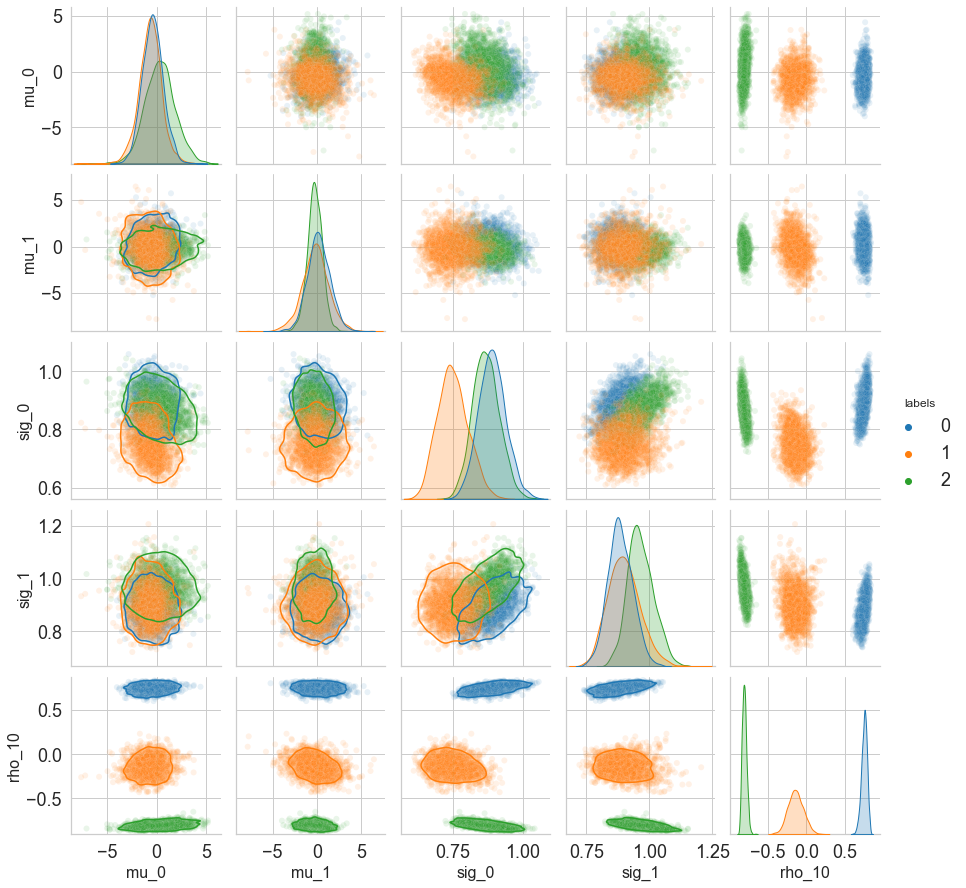

In [73]:
%%time

val_alpha = 0.1
c_list = sns.color_palette("tab10")[:nC]

dir_plot = f'PairPlots/Synthetic_test_Cluster_D{N_dim_true}/HBM_Gibbs'
os.makedirs(dir_plot, exist_ok=True)

tmp_df_clus = []
for key, val in data_Gauss.items():
    val['labels'] = key
    tmp_df_clus.append(deepcopy(val))
tmp_df_clus = pd.concat(tmp_df_clus, axis=0)

sns.set(rc={'font.size': 8, 'axes.labelsize': 16, 'legend.fontsize': 18, 
    'axes.titlesize': 8, 'xtick.labelsize': 18, 'ytick.labelsize': 18})
sns.set_style("whitegrid")
    
sns_plot = sns.pairplot(tmp_df_clus, diag_kind="kde", hue='labels', 
                 palette=c_list, plot_kws={'alpha': val_alpha})
sns_plot.map_lower(sns.kdeplot, levels=2, color=".2")
sns_plot.savefig(f'{dir_plot}/{case_name}_K{nC}_S{selected_seed}_N{n_repeat}.png', dpi=500)
    

Global case

In [ ]:
dir_save_data = 'Data/SynData_Cluster_D2_Str202111_Ste20211100'

with open(f'{dir_save_data}/HBM_Gibbs_All_S202111.pkl', 'rb') as f:
    tmp = pk.load(f)

mu_s = tmp['mu_s']
C_s = tmp['C_s']
mu_0 = tmp['mu_0']
C_0 = tmp['C_0']
Sig_0 = tmp['Sig_0']
nu_0 = tmp['nu_0']
a_k = tmp['a_k']


In [ ]:
%%time

N_burn = 1000
del_t = 10
N_i = 1
Nt = mu_0[list(mu_0.keys())[0]].shape[1]
N_psi = len(list(range(N_burn, Nt, del_t)))
Ndim = x_cluster[list(x_cluster.keys())[0]][0].shape[1]
rand_seed = 202111

np.random.seed(rand_seed)
rand_seeds = np.random.randint(0, 2**32-1, size=N_psi)

col_mu = [f'mu_{x}' for x in range(Ndim)]
col_sig = [f'sig_{x}' for x in range(Ndim)]
col_rho = [f'rho_{y}{x}' for y in range(1, Ndim) for x in range(y)]

data_Gauss = {}
for key in mu_0.keys():
    if N_i == 1:
        data_Mu = np.zeros([Ndim, N_psi])
        data_Sigma = np.zeros([Ndim, Ndim, N_psi])

        for ii, iS in enumerate(range(N_burn, Nt, del_t)):
            data_Mu[:, ii] = multivariate_normal.rvs(mean=mu_0[key][:, iS], cov=C_0[key][:, :, iS], random_state=rand_seeds[ii]).T
            data_Sigma[:, :, ii] = invwishart.rvs(df=nu_0[key][iS], scale=Sig_0[key][:, :, iS], random_state=rand_seeds[ii]).T
    else:
        data_Mu = np.zeros([Ndim, N_i, N_psi])
        data_Sigma = np.zeros([Ndim, Ndim, N_i, N_psi])

        for ii, iS in enumerate(range(N_burn, Nt, del_t)):
            data_Mu[:, :, ii] = multivariate_normal.rvs(mean=mu_0[key][:, iS], cov=C_0[key][:, :, iS], size=N_i, random_state=rand_seeds[ii]).T
            data_Sigma[:, :, :, ii] = invwishart.rvs(df=nu_0[key][iS], scale=Sig_0[key][:, :, iS], size=N_i, random_state=rand_seeds[ii]).T

    mu = data_Mu[:Ndim,].reshape(Ndim,-1)
    cov = data_Sigma[:Ndim,:Ndim,].reshape(Ndim,Ndim,-1)
    sig = np.sqrt(np.diagonal(cov).T)
    rho = np.vstack([cov[y,x,:]/sig[y,:]/sig[x,:] for y in range(1, Ndim) for x in range(y)])

    data_Gauss[key] = pd.DataFrame(np.concatenate([mu, sig, rho]).T, columns=col_mu+col_sig+col_rho)
    

CPU times: user 29.9 s, sys: 194 ms, total: 30 s
Wall time: 16.2 s


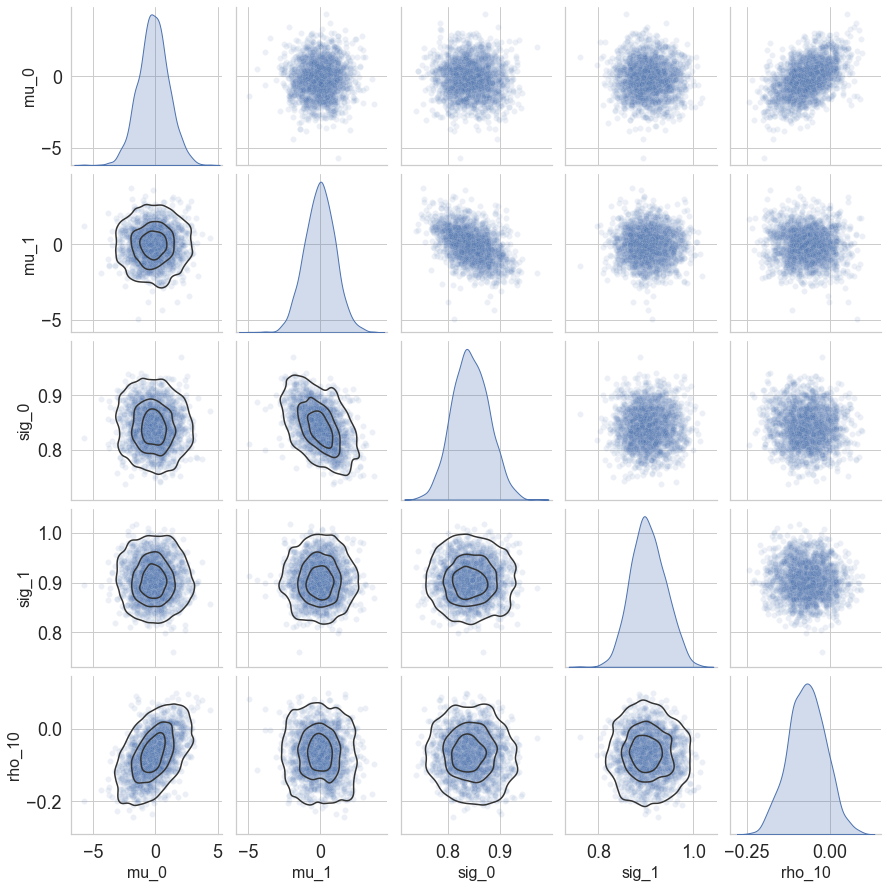

In [70]:
%%time

val_alpha = 0.1
c_list = sns.color_palette("tab10")[0:1]

dir_plot = f'PairPlots/Synthetic_test_Cluster_D{N_dim_true}/HBM_Gibbs'
os.makedirs(dir_plot, exist_ok=True)

tmp_df_clus = []
for key, val in data_Gauss.items():
    tmp_df_clus.append(deepcopy(val))
tmp_df_clus = pd.concat(tmp_df_clus, axis=0)

sns.set(rc={'font.size': 8, 'axes.labelsize': 16, 'legend.fontsize': 18, 
    'axes.titlesize': 8, 'xtick.labelsize': 18, 'ytick.labelsize': 18})
sns.set_style("whitegrid")
    
sns_plot = sns.pairplot(tmp_df_clus, diag_kind="kde", plot_kws={'alpha': val_alpha})
sns_plot.map_lower(sns.kdeplot, levels=4, color=".2")
sns_plot.savefig(f'{dir_plot}/{case_name}_K{nC}_All.png', dpi=500)
    

### Prediction for test data

Load HBM samples

In [94]:
dir_load = 'Data/SynData_Cluster_D2_Str202111_Ste20211100'
f_all = 'HBM_Gibbs_All_S202111.pkl'
f_cluster = 'HBM_Gibbs_Sk6803724_S202111_N1.pkl'

with open(f'{dir_load}/{f_all}', 'rb') as f:
    S_all = pk.load(f)
    
with open(f'{dir_load}/{f_cluster}', 'rb') as f:
    S_clus = pk.load(f)
    

In [117]:
%%time

N_burn = 1000
del_t = 10 # pick one for every del_t samples
N_i = 1
rand_seed = 202111

prd_hbm = {}

tmp_dict = {}
for key, val in S_all.items():
    tmp_dict[key] = val['All']
    
prd_hbm['All'] = HBM_prd(deepcopy(tmp_dict))

tmp_dict = {key: {} for key in S_clus[list(S_clus.keys())[0]].keys()}
for key, val in S_clus.items():
    for kK, vV in val.items():
        tmp_dict[kK][key] = vV
    
for key, val in tmp_dict.items():
    prd_hbm[f'K-{key+1}'] = HBM_prd(deepcopy(val))
    
for key, val in prd_hbm.items():
    _ = val.gen_gauss_samples(N_burn=N_burn, del_t=del_t, N_i=N_i, rand_seed=rand_seed)
    

CPU times: user 4.76 s, sys: 80.5 ms, total: 4.84 s
Wall time: 4.84 s


##### Predict distribution using 1,3,5,10 samples

Calculate likelihoods for weighting

In [118]:
%%time

TF_singular = False #set to True if any case fail

data_in = x_test_df.drop(['label'], axis=1)
data_w = {}
for key, val in prd_hbm.items():
    data_w[key] = pd.DataFrame(index=data_in.index, columns=list(range(val._gen_mu.shape[1])))
    for i, mu in enumerate(val._gen_mu.T):
        data_w[key].loc[:,i] = multivariate_normal.logpdf(data_in, mean=mu, cov=val._gen_cov[:,:,i], allow_singular=TF_singular)
    

CPU times: user 6.37 s, sys: 75.9 ms, total: 6.44 s
Wall time: 6.44 s


In [119]:
data_idx =[[0], [0, 2, 4], [0, 2, 4, 6, 8], [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]]
case_names = [f'{len(x)}data' for x in data_idx]

site_labels = {}
for lab in x_test_df['label'].unique():
    site_labels[lab] = x_test_df.index[x_test_df['label'] == lab].values
    
clus_labels = list(data_w.keys())


In [120]:
wC_logP = {}
for iC, d_idx in enumerate(data_idx):
    wC_logP[case_names[iC]] = pd.DataFrame(index=np.sort(list(site_labels.keys())), columns=clus_labels, dtype=float)
    for key_s, s_idx in site_labels.items():
        for key_k, val in data_w.items():
            wC_logP[case_names[iC]].loc[key_s, key_k] = logsumexp(val.loc[s_idx,:].values[data_idx[iC],:].sum(axis=0)) - np.log(val.shape[1])
            

In [128]:
tmp_labels = np.sort([x for x in clus_labels if not x == 'All'])

df_w = {}
for key, val in wC_logP.items():
    df_w[key] = pd.DataFrame(index=val.index, columns=tmp_labels)
    for idx, vV in val.iterrows():
        df_w[key].loc[idx,:] = np.exp(vV[tmp_labels] - logsumexp(vV[tmp_labels]))


In [122]:
df_w_ex = {}
for key, val in wC_logP.items():
    df_w_ex[key] = pd.DataFrame(index=val.index, columns=val.columns)
    for idx, vV in val.iterrows():
        df_w_ex[key].loc[idx,:] = np.exp(vV - logsumexp(vV))


Plot weights over different cases

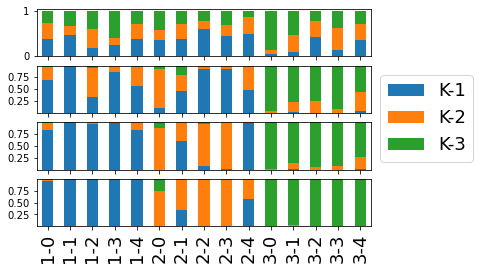

In [129]:
dir_plot = f'HBM_plots/Synthetic_test_Cluster_D{N_dim_true}'
os.makedirs(dir_plot, exist_ok=True)

# Set up the matplotlib figure
f, ax = plt.subplots(4, 1, sharex=True)

for iC, (key, val) in enumerate(df_w.items()):
    _ = val.plot.bar(stacked=True, ax=ax[iC], legend=False)

handles, labels = ax[0].get_legend_handles_labels()
# f.legend(handles, labels, loc='center right')
_ =f.legend(handles, labels, loc='center left', bbox_to_anchor=(0.9, 0.5), fontsize=18)
_ =plt.xticks(fontsize=18)
f.savefig(f'{dir_plot}/Test_weights_barplot.png', dpi=500)


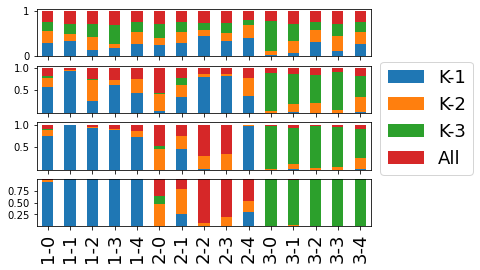

In [125]:
dir_plot = f'HBM_plots/Synthetic_test_Cluster_D{N_dim_true}'
os.makedirs(dir_plot, exist_ok=True)

col_order = ['K-1','K-2','K-3','All']

# Set up the matplotlib figure
f, ax = plt.subplots(4, 1, sharex=True)

for iC, (key, val) in enumerate(df_w_ex.items()):
    tmp_val = val[col_order]
    _ = tmp_val.plot.bar(stacked=True, ax=ax[iC], legend=False)

handles, labels = ax[0].get_legend_handles_labels()
# f.legend(handles, labels, loc='center right')
_ =f.legend(handles, labels, loc='center left', bbox_to_anchor=(0.9, 0.5), fontsize=18)
_ =plt.xticks(fontsize=18)
f.savefig(f'{dir_plot}/Test_weights_ex_barplot.png', dpi=500)


Generate site samples

In [126]:
%%time

N_burn_h=1000
del_t_h=10

Nt = 21
del_t = 1
N_burn = 20

rand_seed = 202111

np.random.seed(rand_seed)
rand_seeds = np.random.randint(0, 2 ** 32 - 1, size=len(data_idx))

x_samples_all = []
for iD, d_idx in enumerate(data_idx):
#     d_idx = data_idx[0]

    tmp_data_df = x_test_df.drop(['label'], axis=1)

    x_S = []
    for key, val in site_labels.items():
        x_S.append(tmp_data_df.loc[val,:].values[d_idx,:])

    x_samples_all.append(
        prd_hbm['All'].gen_x_samples(
            x_S=x_S, N_burn=N_burn, del_t=del_t, Nt=Nt, rand_seed=rand_seeds[iD], N_burn_h=N_burn_h, del_t_h=del_t_h))
    

CPU times: user 8min 36s, sys: 945 ms, total: 8min 37s
Wall time: 8min 38s


In [147]:
%%time

N_burn_h=1000
del_t_h=10

Nt = 21
del_t = 1
N_burn = 20

rand_seed = 202111

np.random.seed(rand_seed)
rand_seeds = np.random.randint(0, 2 ** 32 - 1, size=len(data_idx))

x_samples_clus = []
for iD, d_idx in enumerate(data_idx):
#     d_idx = data_idx[0]

    tmp_data_df = x_test_df.drop(['label'], axis=1)

    x_S = []
    for key, val in site_labels.items():
        x_S.append(tmp_data_df.loc[val,:].values[d_idx,:])

    tmp_w = df_w[case_names[iD]]
    tmp_x_samples = []
    for iC in tmp_w.columns.values:
        tmp_x_samples.append(prd_hbm[iC].gen_x_samples(
            x_S=x_S, N_burn=N_burn, del_t=del_t, Nt=Nt, rand_seed=rand_seeds[iD], N_burn_h=N_burn_h, del_t_h=del_t_h))
        
    x_samples_clus.append([])
    for iR in range(tmp_w.shape[0]):
        tmp_all_s = []
        tmp_all_w = []
        for iC, val in enumerate(tmp_x_samples):
            if len(tmp_all_w) == 0:
                tmp_all_s = val[iR]
                tmp_all_w = np.repeat(tmp_w.iloc[iR, iC]/val[iR].shape[0], val[iR].shape[0])
            else:
                tmp_all_s = np.concatenate([tmp_all_s, val[iR]], axis=0)
                tmp_all_w = np.concatenate([tmp_all_w, np.repeat(tmp_w.iloc[iR, iC]/val[iR].shape[0], val[iR].shape[0])], axis=0)
                
        x_samples_clus[-1].append(
            tmp_all_s[np.random.choice(tmp_all_s.shape[0], size=int(tmp_all_s.shape[0]/len(tmp_x_samples)), p=tmp_all_w),:])
    

CPU times: user 25min 29s, sys: 2.71 s, total: 25min 32s
Wall time: 25min 33s


In [148]:
dir_save = 'Data/SynData_Cluster_D2_Str202111_Ste20211100'

with open(f'{dir_save}/Test_x_samples_all.pkl', 'wb') as f:
    pk.dump(x_samples_all, f)
    
with open(f'{dir_save}/Test_x_samples_clusters.pkl', 'wb') as f:
    pk.dump(x_samples_clus, f)
    

/opt/miniconda3/envs/MB16_xepy37_v06_test_env/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


CPU times: user 24 s, sys: 708 ms, total: 24.7 s
Wall time: 24.7 s


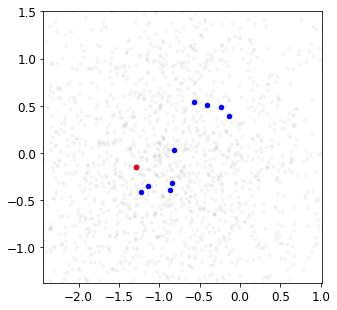

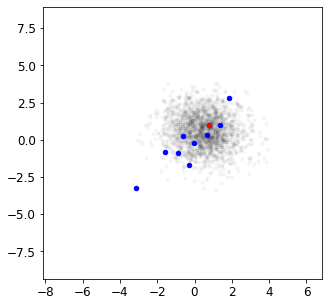

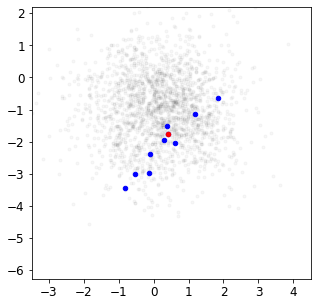

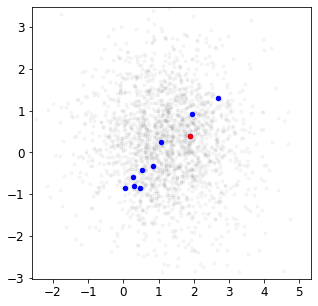

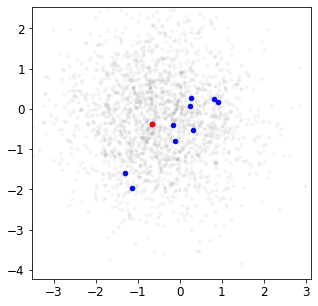

...

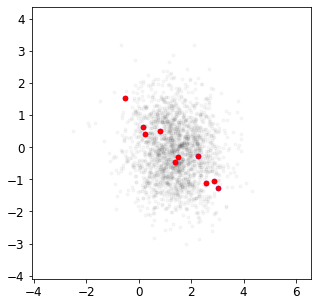

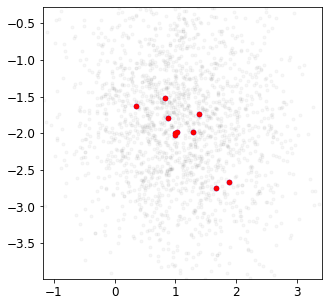

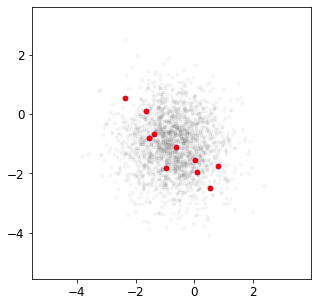

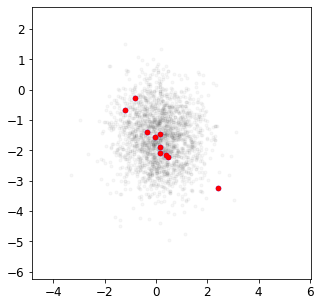

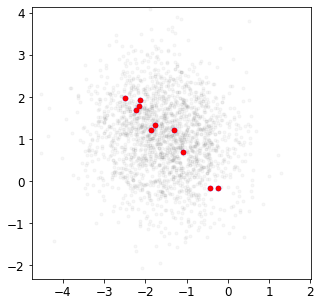

In [171]:
%%time

site_keys = list(site_labels.keys())

v_alpha = 0.03
dot_size = 10

# case_text = ['1data', '2data', '3data', '5data']

for ii, x_samples in enumerate(x_samples_all):
    dir_plot = f'HBM_plots/Synthetic_test_Cluster_D{N_dim_true}/Test_all_{case_names[ii]}'
    os.makedirs(dir_plot, exist_ok=True)

    for iS, x_tmp in enumerate(x_samples):
        x_test_tmp = x_test_df.drop(['label'], axis=1).loc[site_labels[site_keys[iS]],:].values

        for i1 in range(x_tmp.shape[1]-1):
            for i2 in range(i1+1,x_tmp.shape[1]):
                
                x_max = x_test_tmp[:,[i1,i2]].max(axis=0)
                x_min = x_test_tmp[:,[i1,i2]].min(axis=0)
                x_del = x_max - x_min
                xy_max = (x_max + x_del*1)
                xy_min = (x_min - x_del*1)
                
                plt.figure(figsize=(5,5))
                _ = plt.scatter(x_tmp[:,i1], x_tmp[:,i2], s=dot_size, c='k', alpha=v_alpha)
                _ = plt.scatter(x_test_tmp[:, i1], x_test_tmp[:, i2], s=dot_size*2, c='b')
                _ = plt.scatter(x_test_tmp[data_idx[ii], i1], x_test_tmp[data_idx[ii], i2], s=dot_size*2, c='r')
                plt.xticks(fontsize= 12)
                plt.yticks(fontsize= 12)
                plt.xlim([xy_min[0], xy_max[0]])
                plt.ylim([xy_min[1], xy_max[1]])
                plt.savefig(f'{dir_plot}/{site_keys[iS]}_rho{i1}-{i2}.png', dpi=500)


/opt/miniconda3/envs/MB16_xepy37_v06_test_env/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


CPU times: user 21.4 s, sys: 653 ms, total: 22.1 s
Wall time: 22.1 s


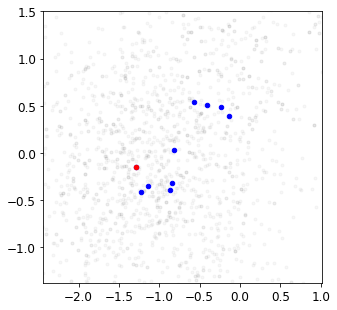

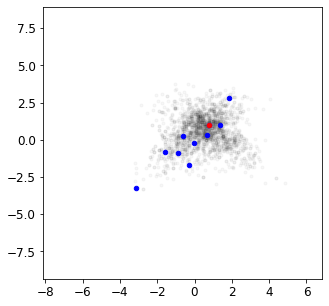

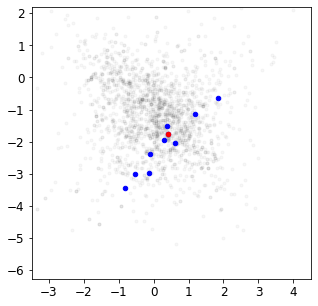

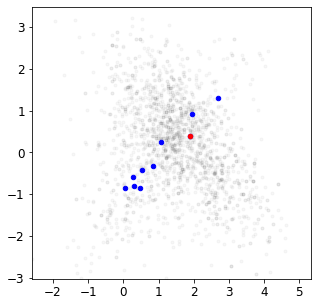

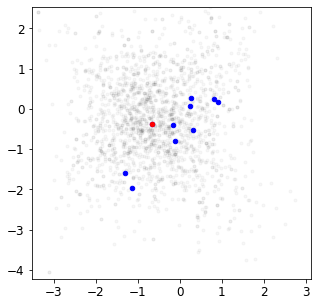

...

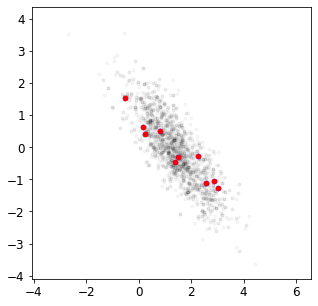

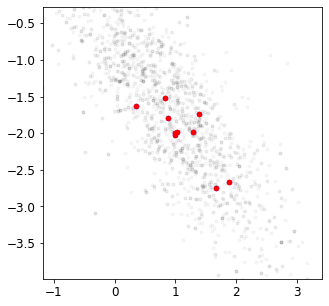

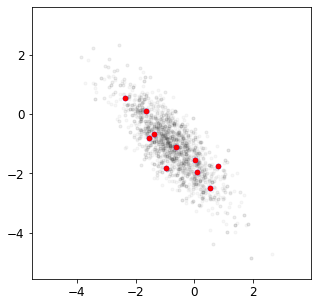

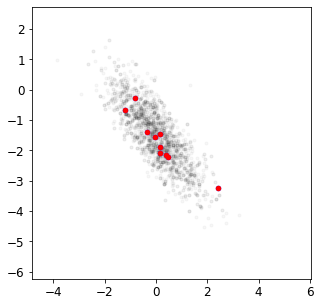

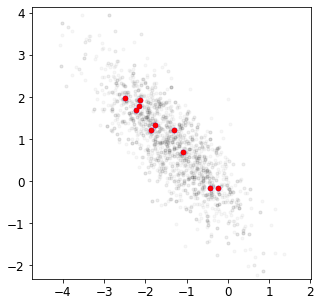

In [172]:
%%time

site_keys = list(site_labels.keys())

v_alpha = 0.03
dot_size = 10

# case_text = ['1data', '2data', '3data', '5data']

for ii, x_samples in enumerate(x_samples_clus):
    dir_plot = f'HBM_plots/Synthetic_test_Cluster_D{N_dim_true}/Test_clusters_{case_names[ii]}'
    os.makedirs(dir_plot, exist_ok=True)

    for iS, x_tmp in enumerate(x_samples):
        x_test_tmp = x_test_df.drop(['label'], axis=1).loc[site_labels[site_keys[iS]],:].values

        for i1 in range(x_tmp.shape[1]-1):
            for i2 in range(i1+1,x_tmp.shape[1]):
                
                x_max = x_test_tmp[:,[i1,i2]].max(axis=0)
                x_min = x_test_tmp[:,[i1,i2]].min(axis=0)
                x_del = x_max - x_min
                xy_max = (x_max + x_del*1)
                xy_min = (x_min - x_del*1)
                
                plt.figure(figsize=(5,5))
                _ = plt.scatter(x_tmp[:,i1], x_tmp[:,i2], s=dot_size, c='k', alpha=v_alpha)
                _ = plt.scatter(x_test_tmp[:, i1], x_test_tmp[:, i2], s=dot_size*2, c='b')
                _ = plt.scatter(x_test_tmp[data_idx[ii], i1], x_test_tmp[data_idx[ii], i2], s=dot_size*2, c='r')
                plt.xticks(fontsize= 12)
                plt.yticks(fontsize= 12)
                plt.xlim([xy_min[0], xy_max[0]])
                plt.ylim([xy_min[1], xy_max[1]])
                plt.savefig(f'{dir_plot}/{site_keys[iS]}_rho{i1}-{i2}.png', dpi=500)


Calculate likelihood

In [151]:
mu_test_concat = np.concatenate(mu_test, axis=0)
C_test_concat = np.concatenate(C_test, axis=0)

test_likelihood = {key: pd.DataFrame(index=val.index, columns=['HBM-Gibbs', 'HBM-Clus']) for key, val in df_w.items()}

for iC, (iCase, _) in enumerate(df_w.items()):
    for ii, mu in enumerate(mu_test_concat):
        test_likelihood[iCase].iloc[ii, 0] = multivariate_normal.logpdf(x_samples_all[iC][ii], mean=mu, cov=C_test_concat[ii,:,:]).sum()
        test_likelihood[iCase].iloc[ii, 1] = multivariate_normal.logpdf(x_samples_clus[iC][ii], mean=mu, cov=C_test_concat[ii,:,:]).sum()
    

In [152]:
test_likelihood

{'1data':         HBM-Gibbs      HBM-Clus
 1-0 -35027.631861 -30105.822083
 1-1 -13122.359261 -12771.553315
 1-2 -40224.019855 -44655.521966
 1-3 -32263.608867 -39066.731043
 1-4 -21997.618447 -21320.004963
 2-0  -8754.518881  -9529.657891
 2-1  -8130.438414  -8026.979377
 2-2  -6576.092588  -7122.813452
 2-3  -6550.859856  -6619.845798
 2-4  -6265.795936   -6169.98622
 3-0 -24515.733842 -12834.994272
 3-1 -25412.837883 -16856.475593
 3-2 -17370.377932 -18068.551609
 3-3 -20765.152732 -16110.664505
 3-4 -47299.972266 -50705.418828,
 '3data':         HBM-Gibbs      HBM-Clus
 1-0 -29095.518515 -15981.009668
 1-1 -12204.693002  -8133.606433
 1-2 -26888.481987 -20491.035473
 1-3  -28550.28639 -13352.015946
 1-4 -15303.793822  -9783.739495
 2-0   -7347.30149  -6941.529499
 2-1  -6669.724395  -6353.777191
 2-2  -6141.898526  -6727.550673
 2-3  -6680.199382  -6862.451834
 2-4  -5916.559644   -5728.94138
 3-0 -19876.727838  -8719.235897
 3-1 -19761.711429  -9633.360082
 3-2 -13188.647988  -709

<Figure size 576x360 with 0 Axes>

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

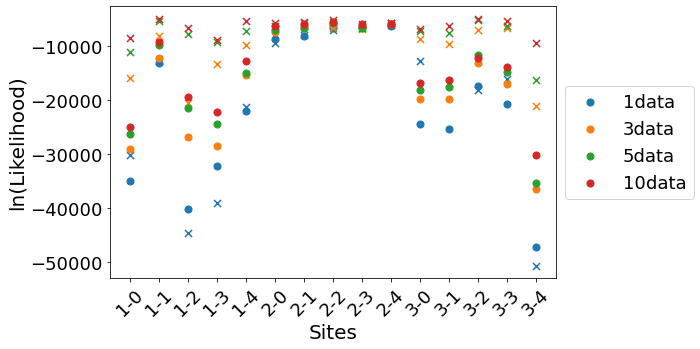

In [176]:
dir_plot = f'HBM_plots/Synthetic_test_Cluster_D{N_dim_true}'
os.makedirs(dir_plot, exist_ok=True)

dot_size = 50
c_list = sns.color_palette("tab10")[:len(test_likelihood)]

plt.figure(figsize=(8,5))
for ii, (key, val) in enumerate(test_likelihood.items()):
    _ = plt.scatter(val.index.values, val['HBM-Gibbs'].values, s=dot_size, c=c_list[ii], label=key)
    _ = plt.scatter(val.index.values, val['HBM-Clus'].values, s=dot_size, c=c_list[ii], marker = 'x')
    
_ =plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=18)
_ =plt.xticks(fontsize=18, rotation=45)
_ =plt.yticks(fontsize=18)
_ =plt.xlabel('Sites', fontsize=20)
_ =plt.ylabel('ln(Likelihood)', fontsize=20)
_ =plt.savefig(f'{dir_plot}/result_loglikelihood.png', dpi=500)
